<a href="https://colab.research.google.com/github/brisabn/Tarefa5-MCF/blob/main/AlgoritmoGenetico.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Algoritmo Genético aplicado no Problema do Caixeiro Viajante

Trabalho de Métodos Computacionais de Física

Brisa do Nascimento Barbosa

Universidade Federal de Minas Gerais (UFMG)

Repositório no GitHub para melhor visualização: https://github.com/brisabn/Tarefa5-MCF

In [ ]:
!pip install tsplib95

In [ ]:
import numpy as np
import networkx as nx
import tsplib95
from matplotlib.animation import FuncAnimation
import pandas as pd
import matplotlib.pyplot as plt
contador_calcular_fitness = 0

## Criação do grafo

In [ ]:
# Função para ler informações dos datasets
def read_datasets_info(file_path):
    df = pd.read_csv(file_path, skiprows=1, delim_whitespace=True, names=["Dataset", "Nodes", "Threshold"])
    df["Nodes"] = df["Nodes"].astype(int)
    df["Threshold"] = df["Threshold"].astype(int)
    datasets_info = df.set_index("Dataset").to_dict(orient="index")
    return datasets_info

def random_graph(N, x_coords, y_coords):
    G = nx.complete_graph(N)
    for i in range(N):
        for j in range(i + 1, N):
            distance = ((x_coords[i] - x_coords[j]) ** 2 + (y_coords[j] - y_coords[i]) ** 2) ** 0.5 # dist euclidiana
            G[i][j]['weight'] = distance
            G[j][i]['weight'] = distance
    return G

def load_instance(arg, N=None):
    if arg.endswith('.tsp'):
        # Carrega o grafo da biblioteca TSP
        problem = tsplib95.load(arg)
        G = problem.get_graph()
        # Obtém as coordenadas dos nós
        coords = problem.node_coords
        x_coords = [coords[i][0] for i in coords]
        y_coords = [coords[i][1] for i in coords]
        return G, x_coords, y_coords
    elif arg == "random":
        # Gera um grafo aleatório
        x_coords = np.random.rand(N)
        y_coords = np.random.rand(N)
        G = random_graph(N, x_coords, y_coords)
        return G, x_coords, y_coords
    return None, None, None

### Plot e animação

In [521]:
import matplotlib.pyplot as plt

def plot_graph(G, x_coords, y_coords, melhor_dna=None):
    if G is not None and x_coords is not None and y_coords is not None:
        plt.figure(figsize=(6, 4))
        pos = {i: (x_coords[i - 1], y_coords[i - 1]) for i in G.nodes()}

        # Plotar os nós
        plt.scatter(x_coords, y_coords, color='skyblue', s=170, label='Cidades')

        # Adicionar rótulos aos nós
        for i in G.nodes():
            plt.text(x_coords[i - 1], y_coords[i - 1], str(i), fontsize=8, ha='center')

        # Plotar todas as arestas em cinza claro
        edges = G.edges()
        for edge in edges:
            x_vals = [x_coords[edge[0] - 1], x_coords[edge[1] - 1]]
            y_vals = [y_coords[edge[0] - 1], y_coords[edge[1] - 1]]
            plt.plot(x_vals, y_vals, color='lightgray', linewidth=0.8)

        if melhor_dna is not None:
          # Destacar o melhor caminho em laranja
          melhor_x = [x_coords[i - 1] for i in melhor_dna] + [x_coords[melhor_dna[0] - 1]]
          melhor_y = [y_coords[i - 1] for i in melhor_dna] + [y_coords[melhor_dna[0] - 1]]
          plt.plot(melhor_x, melhor_y, 'o-', color='orange', linewidth=2, markersize=5, label='Melhor Caminho')

        # Configurações do gráfico
        plt.xlim(min(x_coords) - 0.1, max(x_coords) + 0.1)
        plt.ylim(min(y_coords) - 0.1, max(y_coords) + 0.1)
        plt.grid(True)
        plt.xlabel('Coordenada x')
        plt.ylabel('Coordenada y')
        plt.title('Posição das Cidades')
        plt.legend(loc='upper right')

        plt.show()
    else:
        print("Erro ao carregar o grafo ou o melhor caminho.")


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

def animation_paths(G, x_coords, y_coords, caminhos, fitness_historico):
    # Parâmetros da figura
    figsize = (6, 4)
    fig, ax = plt.subplots(figsize=figsize)

    # Configurações iniciais do gráfico
    def init():
        ax.set_xlim(min(x_coords) - 0.1, max(x_coords) + 0.1)
        ax.set_ylim(min(y_coords) - 0.1, max(y_coords) + 0.1)
        ax.set_xlabel('Coordenada x')
        ax.set_ylabel('Coordenada y')
        ax.grid(True)
        return []

    # Função de atualização do gráfico
    def update(j):
        ax.clear()
        init()

        caminho = caminhos[j]
        unused_edges = list(G.edges())

        # Posição dos nós para o melhor caminho
        caminho_coords_x = [x_coords[i - 1] for i in caminho] + [x_coords[caminho[0] - 1]]
        caminho_coords_y = [y_coords[i - 1] for i in caminho] + [y_coords[caminho[0] - 1]]

        # Desenhar o caminho melhor
        ax.plot(caminho_coords_x, caminho_coords_y, 'o-', color='orange', linewidth=2, markersize=5)

        # Desenhar os caminhos não utilizados
        for edge in unused_edges:
            x_vals = [x_coords[edge[0] - 1], x_coords[edge[1] - 1]]
            y_vals = [y_coords[edge[0] - 1], y_coords[edge[1] - 1]]
            ax.plot(x_vals, y_vals, 'o--', color='lightgray', linewidth=1, markersize=3)

        # Adicionar rótulos de nós
        ax.scatter(x_coords, y_coords, color='skyblue', s=170, zorder=5)
        for i in G.nodes():
            ax.text(x_coords[i - 1], y_coords[i - 1], str(i), fontsize=8, ha='center', zorder=10)

        # Atualizar título com geração e fitness
        ax.set_title(f'Geração: {j + 1} - Fitness: {fitness_historico[j]:.2f}')
        return []

    # Criação da animação
    anim = animation.FuncAnimation(fig, update, frames=len(caminhos), init_func=init, interval=200, blit=False)
    plt.close()
    return anim

# Para exibir a animação em um notebook Jupyter
def display_animation(anim):
    HTML(anim.to_html5_video())


In [558]:
def plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total):
    # Plotar gráficos para a evolução da aptidão ao longo das gerações
    plt.figure(figsize=(9, 5))
    for fitness_historico, chamadas_fitness in zip(fitness_historico_total, chamadas_fitness_total):
        plt.plot(chamadas_fitness, fitness_historico, alpha=0.5)  # alpha é a transparência das linhas

    plt.title(f"Evolução da Fitness")
    plt.xlabel("Avaliações de Fitness")
    plt.ylabel("Aptidão")
    plt.grid(True)
    plt.show()


In [614]:
from collections import Counter

def plotar_grafico_linha(resultados_fitness):
    # Contar as ocorrências de cada valor de fitness
    contagem_fitness = Counter(resultados_fitness)

    # Separar chaves e valores para o gráfico
    valores_fitness = sorted(contagem_fitness.keys())
    contagem_valores = [contagem_fitness[val] for val in valores_fitness]

    # Plotar o gráfico de linha
    plt.figure(figsize=(9, 4))
    plt.plot(valores_fitness, contagem_valores, marker='o', linestyle='-', color='skyblue')
    plt.fill_between(valores_fitness, contagem_valores, color='skyblue', alpha=0.3)
    plt.xlabel('Valor de Fitness')
    plt.ylabel('Número de Execuções')
    plt.title('Frequência de Fitness')

    plt.xticks(valores_fitness, [f'{x:.3f}' for x in valores_fitness], fontsize=10, rotation=90, ha='right')
    plt.grid(True)
    plt.show()

#### Random

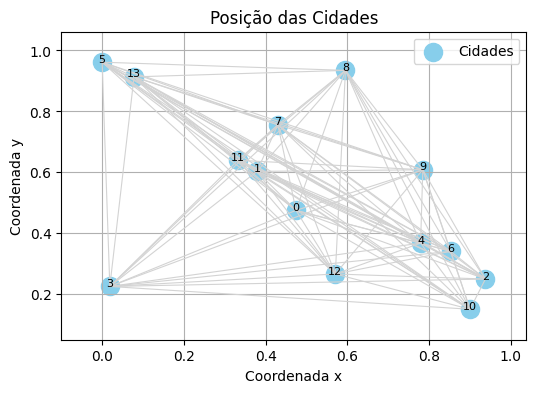

In [522]:
# Grafo aleatório
G, x_coords, y_coords = load_instance("random", 14)
plot_graph(G, x_coords, y_coords)

#### TSP dataset

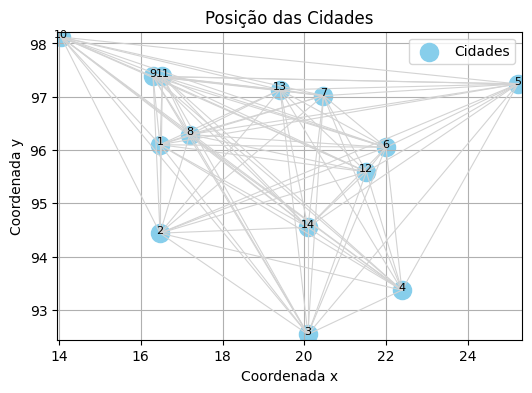

In [ ]:
# Grafo da biblioteca TSP
G, x_coords, y_coords = load_instance("burma14.tsp")
plot_graph(G, x_coords, y_coords)

## Fitness

In [ ]:
# Fitness é a distância total percorrida
def calcular_fitness(dna, G):
    N = len(G.nodes())
    node_labels = list(G.nodes)
    global contador_calcular_fitness
    contador_calcular_fitness += 1  # Incrementa o contador a cada chamada
    dna_mapped = [node_labels[i] for i in dna]
    apt = 0
    for i in range(N - 1):
        apt += G[dna_mapped[i]][dna_mapped[i + 1]]['weight']
    apt += G[dna_mapped[0]][dna_mapped[N - 1]]['weight']  # fecha o ciclo
    return apt


---

## Próxima geração

## Seleção dos pais

In [ ]:
def selecionar_pais(populacao, fitness):
    soma_fitness = sum(fitness)
    probabilidades = [soma_fitness / f for f in fitness]
    acumulado = np.cumsum(probabilidades)

    def escolher_pai():
        sorteio = np.random.rand()
        for i, valor in enumerate(acumulado):
            if sorteio < valor:
                return populacao[i]
        return populacao[-1]

    pai1 = escolher_pai()
    pai2 = escolher_pai()

    return pai1, pai2

## Crossover

### Order Operator (OX)

O procedimento começa selecionando um segmento contínuo de um dos pais e o copiando diretamente para o filho na posição correspondente. Depois, remove das cidades do segundo pai aquelas que já estão na substring, obtendo uma sequência de cidades que o filho precisa. Por fim, coloca essas cidades nas posições não fixas do filho, da esquerda para a direita, de acordo com a ordem da sequência, produzindo o descendente.

In [ ]:
def order_crossover(p1, p2, start, end):
    # Inicializar o filho com None em todos os lugares
    child = [None] * len(p1)

    # Copiar a subsequência de p1 para o filho
    child[start:end] = p1[start:end]

    # Preencher os espaços restantes com os elementos de p2
    pos = end
    for i in range(len(p2)):
        if p2[(i + end) % len(p2)] not in child:
            child[pos % len(p1)] = p2[(i + end) % len(p2)]
            pos += 1

    return child


**Exemplo**

In [ ]:
# Definir os pontos de corte
start, end = 3, 7

# Pais
pai1 = [1, 2, 3, 4, 5, 6, 7, 8, 9]
pai2 = [4, 5, 2, 1, 8, 7, 6, 9, 3]
print(start, end)
# Gerar os filhos
filho1 = order_crossover(pai1, pai2, start, end)
filho2 = order_crossover(pai2, pai1, start, end)

print("Filho 1:", filho1)
print("Filho 2:", filho2)

3 7
Filho 1: [2, 1, 8, 4, 5, 6, 7, 9, 3]
Filho 2: [3, 4, 5, 1, 8, 7, 6, 9, 2]


### Partially-Mapped Operator (PMX)

No PMX, uma subsequência de genes de um dos pais é diretamente copiada para o filho, preservando sua ordem e posição. Em seguida, é criado um mapeamento entre os genes dos pais fora dessa subsequência. Para os genes restantes, o PMX tenta inserir os genes do outro pai no filho, utilizando o mapeamento criado para resolver quaisquer conflitos, garantindo que a ordem relativa dos genes seja preservada o máximo possível.

In [ ]:
def pmx_crossover(p1, p2, start=None, end=None):
    # Definir start e end aleatoriamente se não forem fornecidos
    if start is None or end is None:
        start, end = np.sort(np.random.choice(range(len(p1)), 2, replace=False))

    # Inicializar o filho com None em todos os lugares
    child = [None] * len(p1)

    # Copiar a subsequência de p2 para o filho
    child[start:end] = p2[start:end]

    # Criar o mapeamento dos genes trocados
    mapping = {}
    for i in range(start, end):
        mapping[p2[i]] = p1[i]

    # Preencher os genes remanescentes de p1 no filho
    for i in range(len(p1)):
        if child[i] is None:
            gene = p1[i]
            # Resolver o mapeamento caso o gene esteja mapeado
            while gene in mapping:
                gene = mapping[gene]
            child[i] = gene

    return child

**Exemplo**

In [ ]:
# Definir os pontos de corte
start, end = 3, 7

# Pais
pai1 = [1, 2, 3, 4, 5, 6, 7, 8, 9]
pai2 = [4, 5, 2, 1, 8, 7, 6, 9, 3]

# Gerar os filhos
filho1 = pmx_crossover(pai1, pai2)
filho2 = pmx_crossover(pai2, pai1)

print("Filho 1:", filho1)
print("Filho 2:", filho2)

Filho 1: [1, 2, 3, 4, 8, 7, 6, 9, 5]
Filho 2: [4, 5, 2, 1, 9, 6, 7, 8, 3]


### Cycle Crossover (CX)
A ideia central é identificar ciclos de posições entre os dois pais: começando em um ponto inicial, o gene correspondente é copiado de um dos pais para o filho, e o próximo gene a ser copiado é aquele que ocupa a mesma posição no outro pai. Esse processo continua até que o ciclo se complete, ou seja, até que o gene original seja encontrado novamente. O restante dos genes é preenchido com os valores correspondentes do outro pai.

In [ ]:
def cycle_crossover(p1, p2, start, end):
    size = len(p1)
    child = [-1] * size
    cycle = 0

    while -1 in child:
        index = child.index(-1)
        start = p1[index]

        while True:
            child[index] = p1[index] if cycle % 2 == 0 else p2[index]
            index = p1.index(p2[index])
            if start == p1[index]:
                break

        cycle += 1

    return child

**Exemplo**

In [ ]:
pai1 = [1, 2, 3, 4, 5, 6, 7, 8, 9]
pai2 = [4, 1, 2, 8, 7, 6, 9, 3, 5]

# Gerando os filhos
filho1 = cycle_crossover(pai1, pai2, start, end)
filho2 = cycle_crossover(pai2, pai1, start, end)

print(f"Filho 1: {filho1}")
print(f"Filho 2: {filho2}")

Filho 1: [1, 2, 3, 4, 7, 6, 9, 8, 5]
Filho 2: [4, 1, 2, 8, 5, 6, 7, 3, 9]


## Mutation

In [ ]:
def aplicar_mutacao(dna, mutation_func, mutation_rate=0.7):
    if np.random.rand() < mutation_rate:
        mutation_func(dna)

### Reciprocal Exchange
Sorteia duas cidades e inverte sua posição


In [ ]:
def reciprocal_exchange(filho):
    idx1, idx2 = np.random.choice(range(len(filho)), 2, replace=False)
    filho[idx1], filho[idx2] = filho[idx2], filho[idx1]

**Exemplo**

In [ ]:
fi1 = [1, 2, 3, 4, 5, 6, 7, 8, 9]
reciprocal_exchange(fi1)
print(f"Filho mutado: {fi1}")

Filho mutado: [1, 2, 3, 4, 5, 6, 9, 8, 7]


### Inversion
Inverte a ordem de um subsegmento.

In [ ]:
def inversion_mutation(filho):
    i, j = np.random.choice(len(filho), 2, replace=False)
    if i > j:
        i, j = j, i
    filho[i:j+1] = filho[i:j+1][::-1]

**Exemplo**

In [ ]:
fi1 = [1, 2, 3, 4, 5, 6, 7, 8, 9]
inversion_mutation(fi1)
print(f"Filho mutado: {fi1}")

Filho mutado: [6, 5, 4, 3, 2, 1, 7, 8, 9]


## Função de criar nova geração


In [ ]:
def nova_geracao(populacao, G, crossover_func, mutation_func, m_rate):
    fitness = [calcular_fitness(dna, G) for dna in populacao]
    nova_populacao = []

    # Elitismo: Clonar o melhor indivíduo
    melhor_dna = populacao[np.argmin(fitness)]
    nova_populacao.append(melhor_dna)
    pai1, pai2 = selecionar_pais(populacao, fitness)

    # Criar nova geração com cruzamento e mutação
    while len(nova_populacao) < len(populacao):
        start, end = np.sort(np.random.choice(range(len(pai1)), 2, replace=False))
        filho1 = crossover_func(pai1, pai2, start, end)
        filho2 = crossover_func(pai2, pai1, start, end)

        # Aplicar mutação
        aplicar_mutacao(filho1, mutation_func, m_rate)
        aplicar_mutacao(filho2, mutation_func, m_rate)

        # Adicionar o filho com menor fitness à nova população
        melhor_filho = min((filho1, filho2), key=lambda f: calcular_fitness(f, G))
        nova_populacao.append(melhor_filho)

    return nova_populacao

## Algoritmo Genético

In [ ]:
def algoritmo_genetico(G, crossover, mutacao, max_gen, tamanho_pop, m_rate):
    global contador_calcular_fitness
    # Inicializar população aleatória
    N = len(G.nodes())
    populacao = [np.random.permutation(N).tolist() for _ in range(tamanho_pop)]

    melhor_dna = None
    melhor_fitness = float('inf')

    fitness_historico = []  # Lista para armazenar a aptidão de cada geração
    chamadas_fitness = []  # Lista para armazenar a quantidade de chamadas de calcular_fitness
    caminhos = []  # Lista para armazenar os melhores caminhos de cada geração

    for gen in range(max_gen):
        populacao = nova_geracao(populacao, G, crossover, mutacao, m_rate)

        fitness_geracao = [calcular_fitness(dna, G) for dna in populacao]
        fitness_historico.append(min(fitness_geracao))  # Adiciona a melhor aptidão da geração
        chamadas_fitness.append(contador_calcular_fitness)  # Adiciona a quantidade de chamadas de calcular_fitness

        melhor_indice = np.argmin(fitness_geracao)
        melhor_dna = populacao[melhor_indice]
        melhor_fitness = fitness_geracao[melhor_indice]  # Atualiza a melhor aptidão
        caminhos.append(melhor_dna)  # Adiciona o melhor caminho da geração

    return melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos

## Run

### Escolha de funções


In [ ]:
# Escolher funções de crossover e mutação
crossover_choice = 'CX'  # Escolha entre 'OX', 'PMX', 'CX'
mutacao_choice = 'Inversion'  # Escolha entre 'Reciprocal', 'Inversion'

crossover_func = {
    'OX': order_crossover,
    'PMX': pmx_crossover,
    'CX': cycle_crossover
}[crossover_choice]

mutation_func = {
    'Reciprocal': reciprocal_exchange,
    'Inversion': inversion_mutation
}[mutacao_choice]

### Caso teste - burma14.tsp

In [586]:
# Parâmetros
arg = "burma14.tsp"
G, x_coords, y_coords = load_instance(arg)

crossover_choice = 'CX'
mutacao_choice = 'Inversion'
max_gen= 100
tam_pop= 20
m_rate = 0.6

# Execução do algoritmo
melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
    G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)

# Imprimir a melhor aptidão encontrada
print(f"Melhor fitness encontrada: {melhor_fitness}")


Melhor fitness encontrada: 3323


In [ ]:
# Executar a função e mostrar a animação
anim = animation_paths(G, x_coords, y_coords, caminhos, fitness_historico)
HTML(anim.to_jshtml())

Executando 100 vezes

In [587]:
# Carregar informações do dataset
datasets_info = read_datasets_info("datasets.txt")
dataset_name = arg.split('.')[0]  # Obtém o nome do dataset sem a extensão
threshold = datasets_info[dataset_name]["Threshold"]

# Parâmetros do algoritmo genético
max_gen = 100
tam_pop = 20
m_rate = 0.6
n_execucoes = 100

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

    if melhor_fitness == threshold:
        contador += 1

print(f"Para o dataset {dataset_name}: O resultado foi {threshold} em {contador} de {n_execucoes} execuções.")

Para o dataset burma14: O resultado foi 3323 em 26 de 100 execuções.


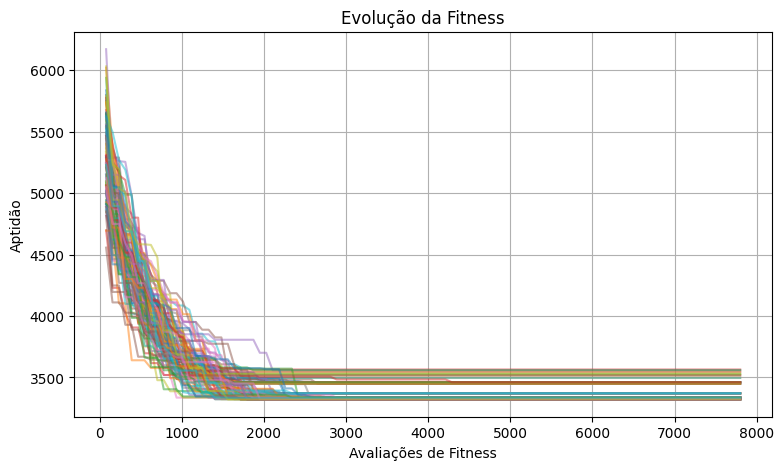

In [588]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)


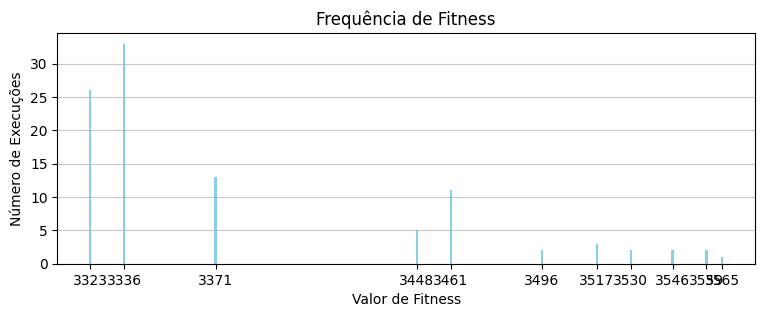

In [591]:
plotar_grafico_barras(resultados_fitness)

### Caso teste - N = 50


In [537]:
# Parâmetros
G, x_coords, y_coords = load_instance("random", 50)

crossover_choice = 'CX'
mutacao_choice = 'Inversion'
max_gen= 250
tam_pop= 20
m_rate = 0.6

# Execução do algoritmo
melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
    G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)

# Imprimir a melhor aptidão encontrada
print(f"Melhor fitness encontrada: {melhor_fitness}")


Melhor fitness encontrada: 6.660732962443655


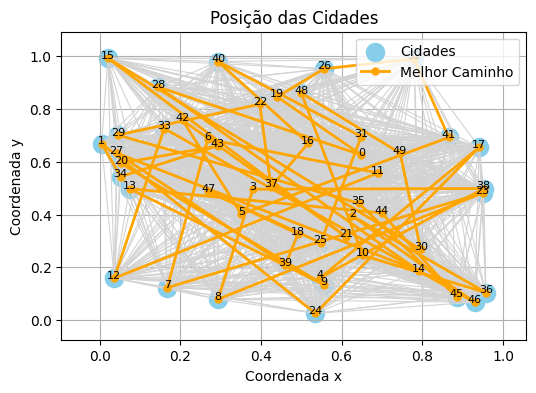

In [538]:
plot_graph(G, x_coords, y_coords, melhor_dna)

## Comparação de funções de crossover e mutação

Seja um grafo de N=15.

In [592]:
# Grafo
G, x_coords, y_coords = load_instance("random", 15)

# Parâmetros do algoritmo genético
max_gen = 100
tam_pop = 20
m_rate = 0.3
n_execucoes = 50


### Crossover com Inversion

**Order Crossover**

In [593]:
# Funções de Crossover e Mutação
crossover_choice = 'OX'
mutacao_choice = 'Inversion'

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

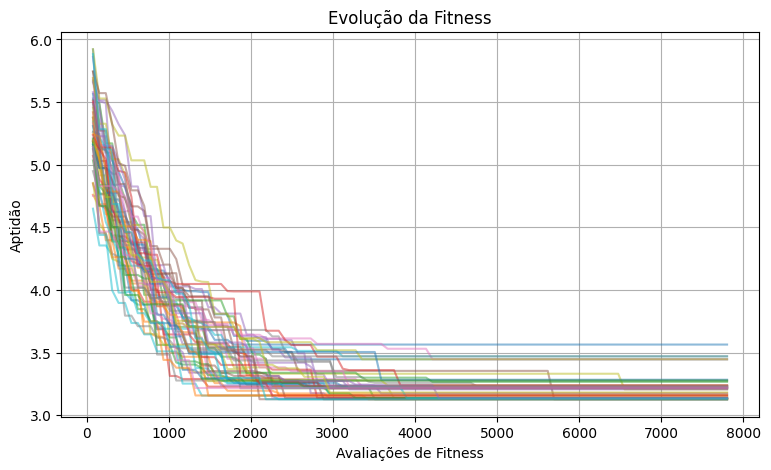

In [594]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)

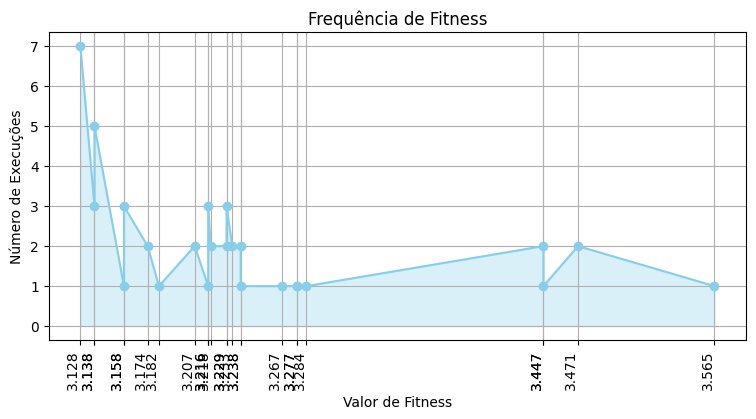

In [615]:
plotar_grafico_linha(resultados_fitness)

**Partially-Mapped Operator**

In [616]:
# Funções de Crossover e Mutação
crossover_choice = 'PMX'
mutacao_choice = 'Inversion'

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

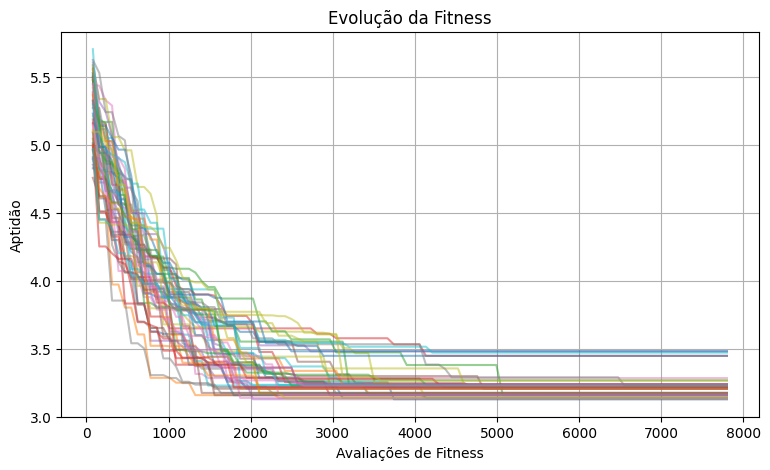

In [617]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)

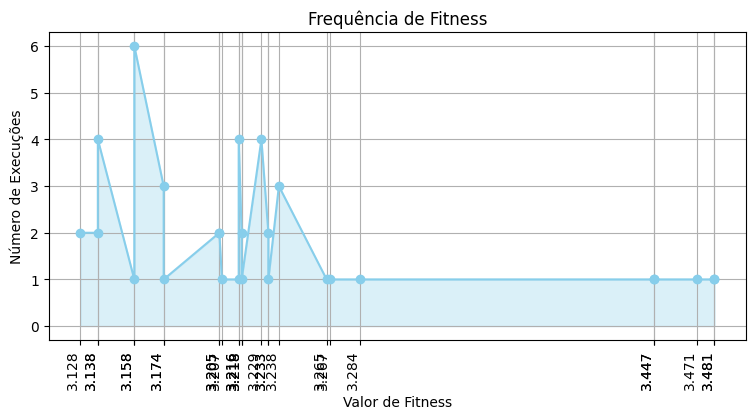

In [618]:
plotar_grafico_linha(resultados_fitness)

**Cycle Crossover**

In [622]:
# Funções de Crossover e Mutação
crossover_choice = 'CX'
mutacao_choice = 'Inversion'

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

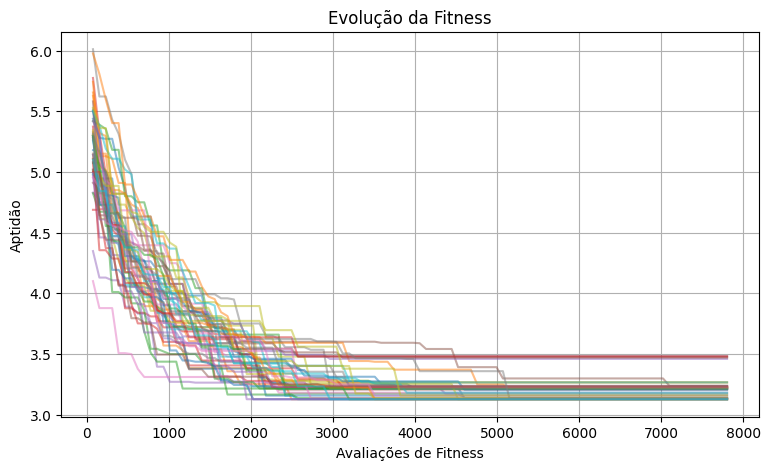

In [623]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)

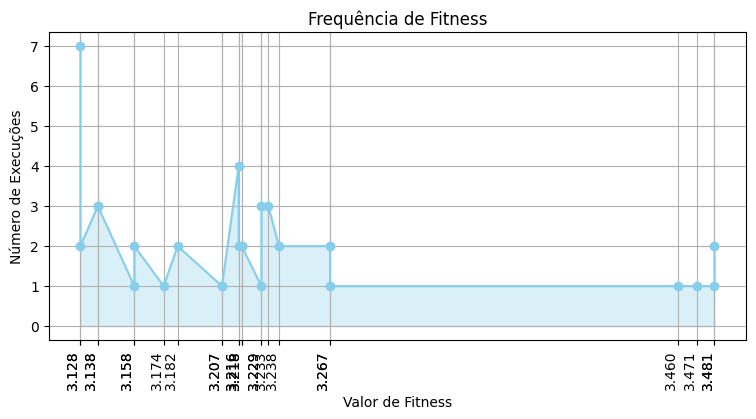

In [624]:
plotar_grafico_linha(resultados_fitness)

### Crossover com Reciprocal Exchange

**Order Operator**



In [626]:
# Funções de Crossover e Mutação
crossover_choice = 'OX'
mutacao_choice = 'Reciprocal Exchange'

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

In [ ]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)

In [ ]:
plotar_grafico_linha(resultados_fitness)

**Partially-Mapped Operator**

In [ ]:
# Funções de Crossover e Mutação
crossover_choice = 'PMX'
mutacao_choice = 'Reciprocal Exchange'

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

In [ ]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)

In [ ]:
plotar_grafico_linha(resultados_fitness)

**Cycle Crossover**

In [ ]:
# Funções de Crossover e Mutação
crossover_choice = 'CX'
mutacao_choice = 'Reciprocal Exchange'

# Inicialização
contador = 0
fitness_historico_total = []
chamadas_fitness_total = []
resultados_fitness = []

# Rodar n execuções
for _ in range(n_execucoes):
    global contador_calcular_fitness
    contador_calcular_fitness = 0  # Reinicia o contador para cada execução
    melhor_dna, melhor_fitness, fitness_historico, chamadas_fitness, caminhos = algoritmo_genetico(
        G, crossover_func, mutation_func, max_gen, tam_pop, m_rate)
    fitness_historico_total.append(fitness_historico)
    chamadas_fitness_total.append(chamadas_fitness)
    resultados_fitness.append(melhor_fitness)

In [ ]:
plotar_evolucao_aptidao(fitness_historico_total, chamadas_fitness_total)

In [ ]:
plotar_grafico_linha(resultados_fitness)

# Referências
* https://mat.uab.cat/~alseda/MasterOpt/

* https://mat.uab.cat/~alseda/MasterOpt/A_Comparison_of_Genetic_Sequencing_Operators.pdf

* https://www.sciencedirect.com/science/article/pii/S089812211101073X